# Introduction
There is a lot of information on runners and their performance for the
Boston Marathon. Pick a year (post-2012 has more info) and do some
clustering.

Specifically, use the tools at hand to determine which clustering
solution, including number of clusters and algorithm used, is best for
the marathon data. Once you have a solution you like, write a data
story, including visualizations, where you teach the reader something
about the Boston Marathon based on your clusters. Write up your
report, including your process from start to finish. You must include
analysis as:

1. Draw bar graphs (both male & female in different color) for each
cluster for male and female, from the bar graphs, you can tell things
as which cluster contains the most number of female (or male).
2. Draw bar graphs for runners in different ranges of age (dividing by 3
groups: 18-25, 26-40, 40-70 or so) for each cluster (in different colors),
from the graph, you should be able to anwser which cluster contains
the most young people, which cluster contains oldest people, etc.
3. Do the same things as above for finishing time (which group runs
fastest).

In [ ]:
%%capture
!wget -O BostonMarathon.csv https://www.dropbox.com/s/rqx2qulje8ag9dm/Boston%20Marathon.csv?dl=0

# Data Overview



In [ ]:
import os
import pandas as pd
import pandas_profiling
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
df = pd.read_csv('/content/BostonMarathon.csv')

In [ ]:
pd.set_option('display.max_columns', None)
df

,10k,name,division,25k,gender,age,official,bib,genderdiv,ctz,35k,overall,pace,state,30k,5k,half,20k,country,city,40k
0,17.37,"Yamamoto, Hiroyuki",8,47.67,M,47,85.25,W1,8,NaN,71.40,8,3.27,NaN,59.18,8.02,39.72,37.65,JPN,Fukuoka,80.43
1,32.58,"Jeptoo, Rita",1,82.43,F,33,138.95,F1,1,NaN,116.37,21,5.30,NaN,99.33,16.22,69.47,65.83,KEN,Eldoret,132.10
2,16.62,"Van Dyk, Ernst F.",1,45.80,M,41,80.60,W2,1,NaN,67.42,1,3.08,NaN,56.45,7.75,38.03,36.10,RSA,Paarl,76.10
3,32.57,"Dibaba, Mare",3,82.43,F,24,140.58,F2,3,NaN,116.37,27,5.37,NaN,99.33,16.20,69.47,65.83,ETH,Shoa,132.95
4,17.12,"Hokinoue, Kota",2,46.37,M,40,81.23,W3,2,NaN,67.83,2,3.10,NaN,57.03,8.02,38.60,36.58,JPN,Nogata Fukuoka,76.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31979,50.72,"Anderson, Steve K.",3414,124.02,M,32,211.75,35908,7500,NaN,174.90,9849,8.08,CA,148.65,26.13,104.78,99.55,USA,Larkspur,200.22
31980,61.28,"McCarthy, Michael P.",5212,165.02,M,34,302.52,35909,15459,NaN,244.70,27456,11.55,MA,203.43,31.07,135.85,128.37,USA,Norwell,285.47
31981,59.00,"Brimmer, Delia C.",5231,157.02,F,21,282.00,35910,10788,NaN,229.62,25092,10.77,CT,192.65,28.18,130.57,123.33,USA,West Simsbury,266.30
31982,63.75,"Morganthal, Amy",5800,167.82,F,38,302.73,35911,12009,NaN,247.18,27476,11.55,MA,207.52,30.98,137.03,129.90,USA,North Andover,285.87


In [ ]:
print (df.dtypes)

10k           object
name          object
division       int64
25k           object
gender        object
age            int64
official     float64
bib           object
genderdiv      int64
ctz           object
35k           object
overall        int64
pace         float64
state         object
30k           object
5k            object
half          object
20k           object
country       object
city          object
40k           object
dtype: object


In [ ]:
df.shape

(31984, 21)

There are **21 features** and **31984 samples**.

## Check data
### Properties

First we look closely into data properties to see what they are.

* **10k**           object: Time to run 10km, *should be in float* (characteristic)
* **name**          object: Name of the person, unique value each one (feature)
* **division**       int64: Divised groups by some criteria (feature)
* **25k**           object: Time to run 25km, *should be in float* (characteristic)
* **gender**        object: 2 values (feature)
* **age**           int64: Age (feature)
* **official**     float64: Time in official overall running (characteristic)
* **bib**           object: ID number of the runner (feature)
* **genderdiv**      int64: Gender division by admin, *should be in category* (feature)
* **ctz**           object: Citizenship (feature)
* **35k**           object: Time to run 25km, *should be in float* (characteristic)
* **overall**        int64: Overall rank? (characteristic)
* **pace**         float64: Average pace (characteristic)
* **state**         object: US State (feature)
* **30k**           object: Time to run 30km, *should be in float* (characteristic)
* **5k**            object: Time to run 5km, *should be in float* (characteristic)
* **half**          object: Time to run half of the overall road, *should be in float* (characteristic)
* **20k**           object: Time to run 20km, *should be in float* (characteristic)
* **country**       object: Country of the runner (feature)
* **city**          object: City of the runner (feature)
* **40k**           object: Time to run 20km, *should be in float* (characteristic)

Drop **name**, **bib**, **genderdiv** since they do not contribute into clustering.



In [ ]:
df1 = df.drop(columns=['name', 'bib', 'genderdiv'])

### Correct datatype

As above, there are some columns we need to change its datatype

* **10k** to *float*
* **25k** to *float*
* **35k** to *float*
* **30k** to *float*
* **5k** to *float*
* **half** to *float*
* **20k** to *float*
* **40k** to *float*

In [ ]:
df_num = df1.copy()

df_num['half'] = pd.to_numeric(df_num['half'], errors='coerce')
df_num['10k'] = pd.to_numeric(df_num['10k'], errors = 'coerce')
df_num['25k'] = pd.to_numeric(df_num['25k'], errors = 'coerce')
df_num['35k'] = pd.to_numeric(df_num['35k'], errors = 'coerce')
df_num['5k'] = pd.to_numeric(df_num['5k'], errors = 'coerce')    
df_num['30k'] = pd.to_numeric(df_num['30k'], errors = 'coerce')     
df_num['20k'] = pd.to_numeric(df_num['20k'], errors = 'coerce')    
df_num['40k'] = pd.to_numeric(df_num['40k'], errors = 'coerce')

In [ ]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31984 entries, 0 to 31983
Data columns (total 18 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   10k       31934 non-null  float64
 1   division  31984 non-null  int64  
 2   25k       31768 non-null  float64
 3   gender    31984 non-null  object 
 4   age       31984 non-null  int64  
 5   official  31984 non-null  float64
 6   ctz       1244 non-null   object 
 7   35k       31950 non-null  float64
 8   overall   31984 non-null  int64  
 9   pace      31984 non-null  float64
 10  state     29408 non-null  object 
 11  30k       31944 non-null  float64
 12  5k        31932 non-null  float64
 13  half      31912 non-null  float64
 14  20k       31933 non-null  float64
 15  country   31984 non-null  object 
 16  city      31983 non-null  object 
 17  40k       31945 non-null  float64
dtypes: float64(10), int64(3), object(5)
memory usage: 4.4+ MB


### Missing value

We look at old data before changing datatype and new data after changing.

In [ ]:
df1.isnull().sum()

10k             0
division        0
25k             0
gender          0
age             0
official        0
ctz         30740
35k             0
overall         0
pace            0
state        2576
30k             0
5k              0
half            0
20k             0
country         0
city            1
40k             0
dtype: int64

In [ ]:
df_num.isnull().sum()

10k            50
division        0
25k           216
gender          0
age             0
official        0
ctz         30740
35k            34
overall         0
pace            0
state        2576
30k            40
5k             52
half           72
20k            51
country         0
city            1
40k            39
dtype: int64

In [ ]:
df_num.describe(include=['O','category'])

,gender,ctz,state,country,city
count,31984,1244,29408,31984,31983
unique,2,84,68,78,5934
top,M,GBR,MA,USA,Boston
freq,17617,171,7587,27233,1034


* Drop **ctz** since we have **country**, **city**, and there are too many missing values.
* Also drop **city** because there are too much unique values.
* Change all unknown value of **state** into *unknown*.
* All missing numeric data is unknown could be filled using **KNN** because some similar rows could have some equal values.



In [ ]:
df_num = df_num.drop(columns=['ctz', 'city'])

In [ ]:
import numpy as np

df_num['state'].replace(np.nan, 'unknown', inplace=True, regex=True)

In [ ]:
df_num.isnull().sum()

10k          50
division      0
25k         216
gender        0
age           0
official      0
35k          34
overall       0
pace          0
state         0
30k          40
5k           52
half         72
20k          51
country       0
40k          39
dtype: int64

In [ ]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31984 entries, 0 to 31983
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   10k       31934 non-null  float64
 1   division  31984 non-null  int64  
 2   25k       31768 non-null  float64
 3   gender    31984 non-null  object 
 4   age       31984 non-null  int64  
 5   official  31984 non-null  float64
 6   35k       31950 non-null  float64
 7   overall   31984 non-null  int64  
 8   pace      31984 non-null  float64
 9   state     31984 non-null  object 
 10  30k       31944 non-null  float64
 11  5k        31932 non-null  float64
 12  half      31912 non-null  float64
 13  20k       31933 non-null  float64
 14  country   31984 non-null  object 
 15  40k       31945 non-null  float64
dtypes: float64(10), int64(3), object(3)
memory usage: 3.9+ MB


In [ ]:
df_filled = df_num.copy()
df_filled = df_filled.drop(columns=['gender', 'state', 'country'])

In [ ]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=10)
df_knn = imputer.fit_transform(df_filled)

In [ ]:
df_filled = pd.DataFrame(df_knn, columns = df_filled.columns)
df_filled['gender'] = df_num['gender']
df_filled['state'] = df_num['state']
df_filled['country'] = df_num['country']

In [ ]:
df_filled

,10k,division,25k,age,official,35k,overall,pace,30k,5k,half,20k,40k,gender,state,country
0,17.37,8.0,47.67,47.0,85.25,71.40,8.0,3.27,59.18,8.02,39.72,37.65,80.43,M,unknown,JPN
1,32.58,1.0,82.43,33.0,138.95,116.37,21.0,5.30,99.33,16.22,69.47,65.83,132.10,F,unknown,KEN
2,16.62,1.0,45.80,41.0,80.60,67.42,1.0,3.08,56.45,7.75,38.03,36.10,76.10,M,unknown,RSA
3,32.57,3.0,82.43,24.0,140.58,116.37,27.0,5.37,99.33,16.20,69.47,65.83,132.95,F,unknown,ETH
4,17.12,2.0,46.37,40.0,81.23,67.83,2.0,3.10,57.03,8.02,38.60,36.58,76.72,M,unknown,JPN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31979,50.72,3414.0,124.02,32.0,211.75,174.90,9849.0,8.08,148.65,26.13,104.78,99.55,200.22,M,CA,USA
31980,61.28,5212.0,165.02,34.0,302.52,244.70,27456.0,11.55,203.43,31.07,135.85,128.37,285.47,M,MA,USA
31981,59.00,5231.0,157.02,21.0,282.00,229.62,25092.0,10.77,192.65,28.18,130.57,123.33,266.30,F,CT,USA
31982,63.75,5800.0,167.82,38.0,302.73,247.18,27476.0,11.55,207.52,30.98,137.03,129.90,285.87,F,MA,USA


In [ ]:
df_filled.isnull().sum()

10k         0
division    0
25k         0
age         0
official    0
35k         0
overall     0
pace        0
30k         0
5k          0
half        0
20k         0
40k         0
gender      0
state       0
country     0
dtype: int64

In [ ]:
df_filled.describe(percentiles = [.01,.99])

,10k,division,25k,age,official,35k,overall,pace,30k,5k,half,20k,40k
count,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000,31984.000000
mean,51.806798,1932.563032,134.083248,42.407079,242.997314,196.892228,15939.587825,9.275658,164.611882,25.757876,111.677048,105.746823,229.172978
std,8.968061,1715.228694,26.253568,11.316496,52.300431,42.023830,9232.978224,1.992486,33.997601,4.327384,21.059010,19.822529,49.436800
min,16.620000,1.000000,45.800000,18.000000,80.600000,67.420000,1.000000,3.080000,56.450000,7.750000,38.030000,36.100000,76.100000
1%,35.824900,17.000000,90.978300,21.000000,158.463200,129.746600,267.830000,6.050000,110.078300,17.880000,76.463200,72.480000,149.578300
50%,50.350000,1425.000000,129.050000,42.000000,232.370000,188.180000,15939.500000,8.870000,157.770000,25.100000,107.850000,102.180000,218.900000
99%,76.833400,6659.170000,210.736800,68.000000,390.930200,319.642500,31611.170000,14.920000,266.170000,37.350000,173.953400,164.553400,370.633600
max,112.380000,6979.000000,289.020000,81.000000,538.880000,449.330000,31931.000000,20.570000,376.380000,86.950000,236.670000,224.350000,508.350000


In [ ]:
df_filled.describe(include=['O'])

,gender,state,country
count,31984,31984,31984
unique,2,69,78
top,M,MA,USA
freq,17617,7587,27233


Now we are clean.

# EDA
We use df_num to EDA.

In [ ]:
%%capture
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
import pandas_profiling
profile = pandas_profiling.ProfileReport(df_num)
profile.to_file("report.html")

In [ ]:
import IPython
IPython.display.HTML(filename='/content/report.html')

Number of variables,16
Number of observations,31984
Missing cells,554
Missing cells (%),0.1%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,3.9 MiB
Average record size in memory,128.0 B
NUM,13
CAT,3
Analysis started,2020-06-14 02:55:41.567775


# K-mean
## Pre-processing data

In [ ]:
df_feature = pd.DataFrame()

df_feature['gender'] = df_filled['gender']
df_feature['state'] = df_filled['state']
df_feature['country'] = df_filled['country']
df_feature['age'] = df_filled['age']
df_feature['division'] = df_filled['division']

In [ ]:
df_feature.head()

,gender,state,country,age,division
0,M,unknown,JPN,47.0,8.0
1,F,unknown,KEN,33.0,1.0
2,M,unknown,RSA,41.0,1.0
3,F,unknown,ETH,24.0,3.0
4,M,unknown,JPN,40.0,2.0


In [ ]:
to_onehot = ['state', 'country', 'gender']
    
df_onehot = pd.get_dummies(df_feature, columns=to_onehot)

In [ ]:
X = df_onehot

In [ ]:
X

,age,division,state_AA,state_AB,state_AE,state_AK,state_AL,state_AP,state_AR,state_AZ,state_BC,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_GU,state_HI,state_IA,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MB,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NB,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NL,state_NM,state_NS,state_NT,state_NV,state_NY,state_OH,state_OK,state_ON,state_OR,state_PA,state_PE,state_PR,state_QC,state_RI,state_SC,state_SD,state_SK,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,state_YT,state_unknown,country_ARG,country_AUS,country_AUT,country_BAH,country_BAR,country_BEL,country_BER,country_BLR,country_BOL,country_BRA,country_BRN,country_CAN,country_CAY,country_CHI,country_CHN,country_COL,country_CRC,country_CRO,country_CZE,country_DEN,country_DOM,country_ECU,country_EGY,country_ESA,country_ESP,country_EST,country_ETH,country_FIN,country_FRA,country_GBR,country_GER,country_GRE,country_GUA,country_HKG,country_HUN,country_INA,country_IND,country_IRL,country_ISL,country_ISR,country_ITA,country_JPN,country_KEN,country_KOR,country_LIE,country_LUX,country_MAR,country_MAS,country_MEX,country_NED,country_NOR,country_NZL,country_PAN,country_PER,country_PHI,country_POL,country_POR,country_QAT,country_ROU,country_RSA,country_RUS,country_SIN,country_SLO,country_SUI,country_SVK,country_SWE,country_TAN,country_THA,country_TPE,country_TRI,country_TUR,country_UAE,country_UKR,country_URU,country_USA,country_VEN,country_VGB,country_ZIM,gender_F,gender_M
0,47.0,8.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,33.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,41.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,24.0,3.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,40.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31979,32.0,3414.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

## Without PCA

In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import normalize

scaler = preprocessing.MinMaxScaler()

X_norm = normalize(X)

X_mm = scaler.fit_transform(X_norm)

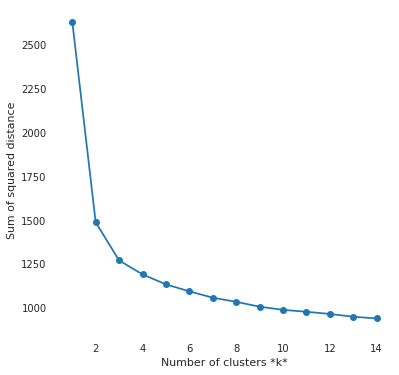

In [ ]:
from sklearn.cluster import KMeans
%matplotlib inline
import matplotlib.pyplot as plt

sse = []
list_k = list(range(1, 15))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(X_mm)
    sse.append(km.inertia_)

plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance')
plt.show()

In [ ]:
y_pred1 = KMeans(n_clusters = 4, random_state = 42).fit_predict(X_mm)

In [ ]:
from sklearn.metrics import silhouette_score

score = silhouette_score(X_mm, y_pred1)
print(score)

0.6337212651794096


## PCA

In [ ]:
from sklearn.decomposition import PCA 
import plotly.express as px

pca = PCA()
pca.fit(X_norm)

cumsum = pca.explained_variance_ratio_.cumsum() // 0.01
n_comp = [i for i in range(1, len(cumsum)+1, 1)]

print(cumsum)
px.bar(y=cumsum, x=n_comp, text=cumsum)

[95. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99. 99.
 99. 99. 99. 99. 99. 99. 99.]


In [ ]:
X_pca = PCA(2).fit_transform(X_norm)

## Elbow method

Text(0, 0.5, 'Sum of squared distance')

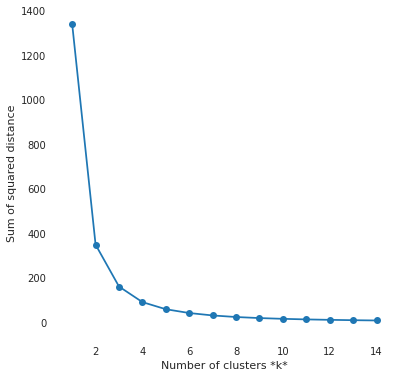

In [ ]:
sse = []
list_k = list(range(1, 15))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(X_pca)
    sse.append(km.inertia_)

plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance')

## Clustering

In [ ]:
y_pred2 = KMeans(n_clusters = 3, random_state = 42).fit_predict(X_pca)

In [ ]:
score = silhouette_score(X_pca, y_pred2)
print(score)

0.8279104976878694


# Review

In [ ]:
df_filled['cluster1'] = y_pred1 + 1
df_filled['cluster2'] = y_pred2 + 1

In [ ]:
df_filled

,10k,division,25k,age,official,35k,overall,pace,30k,5k,half,20k,40k,gender,state,country,cluster1,cluster2
0,17.37,8.0,47.67,47.0,85.25,71.40,8.0,3.27,59.18,8.02,39.72,37.65,80.43,M,unknown,JPN,2,2
1,32.58,1.0,82.43,33.0,138.95,116.37,21.0,5.30,99.33,16.22,69.47,65.83,132.10,F,unknown,KEN,2,2
2,16.62,1.0,45.80,41.0,80.60,67.42,1.0,3.08,56.45,7.75,38.03,36.10,76.10,M,unknown,RSA,2,2
3,32.57,3.0,82.43,24.0,140.58,116.37,27.0,5.37,99.33,16.20,69.47,65.83,132.95,F,unknown,ETH,2,2
4,17.12,2.0,46.37,40.0,81.23,67.83,2.0,3.10,57.03,8.02,38.60,36.58,76.72,M,unknown,JPN,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31979,50.72,3414.0,124.02,32.0,211.75,174.90,9849.0,8.08,148.65,26.13,104.78,99.55,200.22,M,CA,USA,1,1
31980,61.28,5212.0,165.02,34.0,302.52,244.70,27456.0,11.55,203.43,31.07,135.85,128.37,285.47,M,MA,USA,1,1
31981,59.00,5231.0,157.02,21.0,282.00,229.62,25092.0,10.77,192.65,28.18,130.57,123.33,266.30,F,CT,USA,1,1
31982,63.75,5800.0,167.82,38.0,302.73,247.18,27476.0,11.55,207.52,30.98,137.03,129.90,285.87,F,MA,USA,1,1


In [ ]:
gender = pd.DataFrame(columns=['F', 'M'])
gender.loc['cluster 1'] = df_filled[df_filled['cluster1']==1].groupby('gender').count()['cluster1']/df_filled[df_filled['cluster1']==1].count()['cluster1']
gender.loc['cluster 2'] = df_filled[df_filled['cluster1']==2].groupby('gender').count()['cluster1']/df_filled[df_filled['cluster1']==2].count()['cluster1']
gender.loc['cluster 3'] = df_filled[df_filled['cluster1']==3].groupby('gender').count()['cluster1']/df_filled[df_filled['cluster1']==3].count()['cluster1']
gender.loc['cluster 4'] = df_filled[df_filled['cluster1']==4].groupby('gender').count()['cluster1']/df_filled[df_filled['cluster1']==4].count()['cluster1']

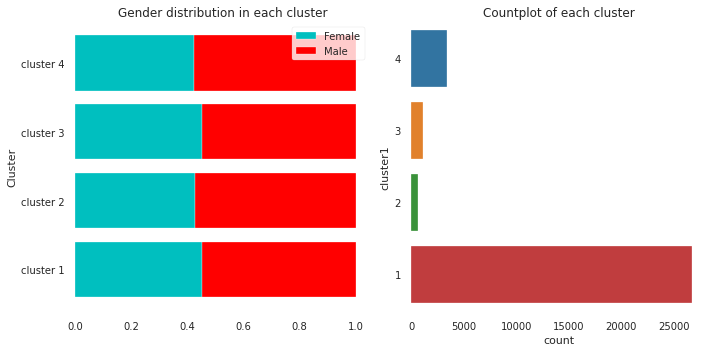

In [ ]:
plt.subplots(1, 2, figsize=(10, 5))

# Stacked horizontal bar chart of percentages
plt.subplot(1, 2, 1)
plt.barh(gender.index, gender.F, color='c', label='Female')
plt.barh(gender.index, gender.M, left=gender.F, color='r', label='Male')
plt.title('Gender distribution in each cluster')
plt.ylabel('Cluster')
plt.legend()

# Countplot of clusters
plt.subplot(1, 2, 2)
sns.countplot(y='cluster1', data=df_filled, order=[4, 3, 2, 1])
plt.title("Countplot of each cluster")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Median age for each cluster')

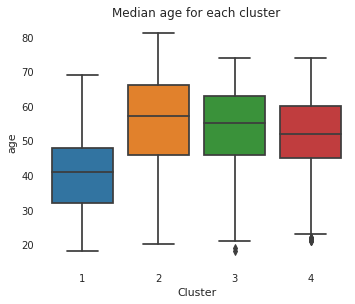

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 2, 1)
sns.boxplot(x='cluster1', y='age', data=df_filled)
plt.xlabel('Cluster')
plt.title('Median age for each cluster')

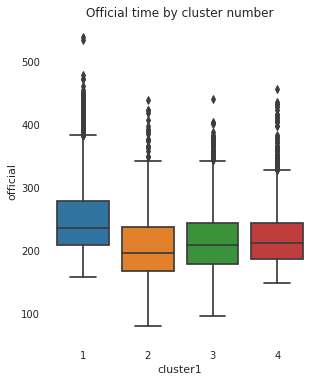

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 3, 1)
sns.boxplot(x='cluster1', y='official', data=df_filled)
plt.title('Official time by cluster number')
    
plt.tight_layout()
plt.show()

In [ ]:
gender = pd.DataFrame(columns=['F', 'M'])
gender.loc['cluster 1'] = df_filled[df_filled['cluster2']==1].groupby('gender').count()['cluster2']/df_filled[df_filled['cluster2']==1].count()['cluster2']
gender.loc['cluster 2'] = df_filled[df_filled['cluster2']==2].groupby('gender').count()['cluster2']/df_filled[df_filled['cluster2']==2].count()['cluster2']
gender.loc['cluster 3'] = df_filled[df_filled['cluster2']==3].groupby('gender').count()['cluster2']/df_filled[df_filled['cluster2']==3].count()['cluster2']

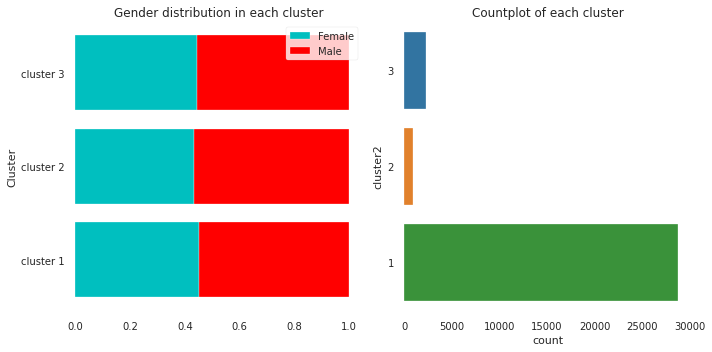

In [ ]:
plt.subplots(1, 2, figsize=(10, 5))

# Stacked horizontal bar chart of percentages
plt.subplot(1, 2, 1)
plt.barh(gender.index, gender.F, color='c', label='Female')
plt.barh(gender.index, gender.M, left=gender.F, color='r', label='Male')
plt.title('Gender distribution in each cluster')
plt.ylabel('Cluster')
plt.legend()

# Countplot of clusters
plt.subplot(1, 2, 2)
sns.countplot(y='cluster2', data=df_filled, order=[3, 2, 1])
plt.title("Countplot of each cluster")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Median age for each cluster')

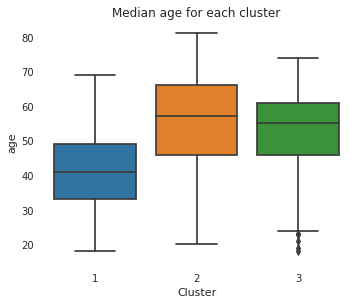

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 2, 1)
sns.boxplot(x='cluster2', y='age', data=df_filled)
plt.xlabel('Cluster')
plt.title('Median age for each cluster')

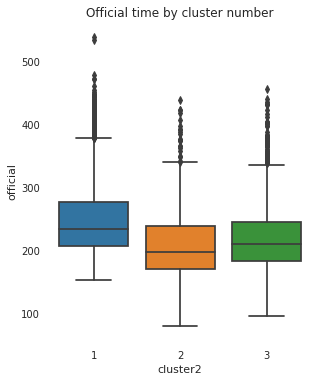

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 3, 1)
sns.boxplot(x='cluster2', y='official', data=df_filled)
plt.title('Official time by cluster number')
    
plt.tight_layout()
plt.show()

# K-prototype

In [ ]:
X_pro = df_feature

In [ ]:
!pip install kmodes

In [ ]:
X_pro

,gender,state,country,age,division
0,M,unknown,JPN,47.0,8.0
1,F,unknown,KEN,33.0,1.0
2,M,unknown,RSA,41.0,1.0
3,F,unknown,ETH,24.0,3.0
4,M,unknown,JPN,40.0,2.0
...,...,...,...,...,...
31979,M,CA,USA,32.0,3414.0
31980,M,MA,USA,34.0,5212.0
31981,F,CT,USA,21.0,5231.0
31982,F,MA,USA,38.0,5800.0


## Without PCA

In [ ]:
num_features = X_pro.select_dtypes(include=[np.number]).columns
X_num = X_pro[num_features]
X_pronorm = normalize(X_num)

In [ ]:
scaler = preprocessing.MinMaxScaler()
X_promm = scaler.fit_transform(X_pronorm)

X_prommDf = pd.DataFrame(data = X_promm, columns = ['age', 'division'])
X_prommDf['state'] = X_pro['state']
X_prommDf['country'] = X_pro['country']
X_prommDf['gender'] = X_pro['gender']

In [ ]:
X_prommDf

,age,division,state,country,gender
0,0.985857,0.157398,unknown,JPN,M
1,0.999616,0.018169,unknown,KEN,F
2,0.999778,0.012189,unknown,RSA,M
3,0.992332,0.113086,unknown,ETH,F
4,0.998825,0.038063,unknown,JPN,M
...,...,...,...,...,...
31979,0.006633,0.999959,CA,USA,M
31980,0.003776,0.999982,MA,USA,M
31981,0.001260,0.999996,CT,USA,F
31982,0.003804,0.999982,MA,USA,F


<function matplotlib.pyplot.show>

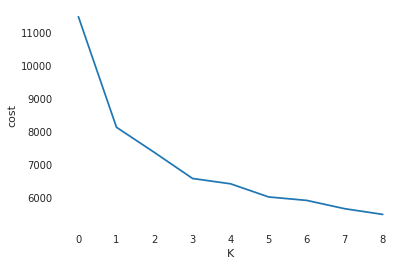

In [ ]:
from kmodes.kprototypes import KPrototypes

cost = []
for num_clusters in list(range(1, 10)):
    kproto = KPrototypes(n_clusters=num_clusters, init='Huang', random_state=42) 
    kproto.fit_predict(X_prommDf, categorical=[2, 3, 4])
    cost.append(kproto.cost_)

plt.plot(cost)
plt.xlabel('K')
plt.ylabel('cost')
plt.show

In [ ]:
kproto = KPrototypes(n_clusters=5, init='Huang', verbose=0, random_state=42,max_iter=20, n_init=50,n_jobs=-2,gamma=.25) 
clusters1 = kproto.fit_predict(X_prommDf, categorical=[2, 3, 4])

In [ ]:
df_filled['cluster3'] = clusters1 + 1
print(df_filled['cluster3'].value_counts())

5    13205
2    11134
1     3443
3     3085
4     1117
Name: cluster3, dtype: int64


In [ ]:
Xnum1 = X_prommDf.drop(['gender', 'state', 'country'], axis=1)
XCat1 = X_prommDf.drop(['age', 'division'], axis=1)
XCat1 = pd.get_dummies(XCat1)

labels = kproto.labels_
usedGamma = kproto.gamma

# calculate the Silhouette score for K-means and K-modes sides 
silScoreKMeans1 = silhouette_score(Xnum1, labels, metric='euclidean')
print('KMeans silhouette: ' + str(silScoreKMeans1))

silScoreKModes1 = silhouette_score(XCat1, labels, metric='hamming')
print('KMeans silhouette: ' + str(silScoreKModes1))

# Average silhouette
silScore1 = (silScoreKMeans1 + silScoreKModes1) / 2
print('The avg silscore: ', silScore1)

silScore11 = (silScoreKModes1*usedGamma) + (silScoreKMeans1*(1-usedGamma))
print('The avg silscore: ', silScore11)

KMeans silhouette: -0.06788172228513575
KMeans silhouette: 0.2516835937053125
The avg silscore:  0.09190093571008838
The avg silscore:  0.012009606712476313


In [ ]:
gender

,F,M
cluster 1,0.138252,0.861748
cluster 2,NaN,1.000000
cluster 3,0.076175,0.923825
cluster 4,0.403760,0.596240
cluster 5,1.000000,NaN


In [ ]:
gender = pd.DataFrame(columns=['F', 'M'])
gender.loc['cluster 1'] = df_filled[df_filled['cluster3']==1].groupby('gender').count()['cluster3']/df_filled[df_filled['cluster3']==1].count()['cluster3']
gender.loc['cluster 2'] = df_filled[df_filled['cluster3']==2].groupby('gender').count()['cluster3']/df_filled[df_filled['cluster3']==2].count()['cluster3']
gender.loc['cluster 3'] = df_filled[df_filled['cluster3']==3].groupby('gender').count()['cluster3']/df_filled[df_filled['cluster3']==3].count()['cluster3']
gender.loc['cluster 4'] = df_filled[df_filled['cluster3']==4].groupby('gender').count()['cluster3']/df_filled[df_filled['cluster3']==4].count()['cluster3']
gender.loc['cluster 5'] = df_filled[df_filled['cluster3']==5].groupby('gender').count()['cluster3']/df_filled[df_filled['cluster3']==5].count()['cluster3']

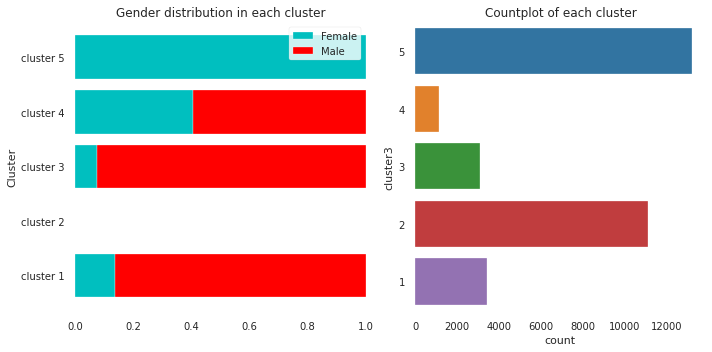

In [ ]:
plt.subplots(1, 2, figsize=(10, 5))

# Stacked horizontal bar chart of percentages
plt.subplot(1, 2, 1)
plt.barh(gender.index, gender.F, color='c', label='Female')
plt.barh(gender.index, gender.M, left=gender.F, color='r', label='Male')
plt.title('Gender distribution in each cluster')
plt.ylabel('Cluster')
plt.legend()

# Countplot of clusters
plt.subplot(1, 2, 2)
sns.countplot(y='cluster3', data=df_filled, order=[5, 4, 3, 2, 1])
plt.title("Countplot of each cluster")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Median age for each cluster')

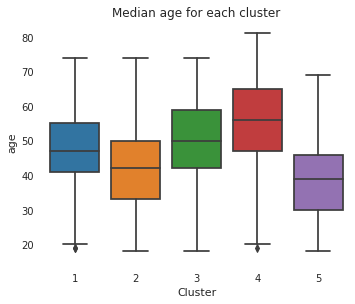

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 2, 1)
sns.boxplot(x='cluster3', y='age', data=df_filled)
plt.xlabel('Cluster')
plt.title('Median age for each cluster')

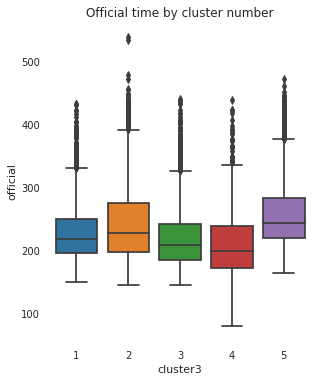

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 3, 1)
sns.boxplot(x='cluster3', y='official', data=df_filled)
plt.title('Official time by cluster number')
    
plt.tight_layout()
plt.show()

## With PCA

In [ ]:
pca = PCA()
X_propca = pca.fit_transform(X_pronorm)

In [ ]:
cumsum = pca.explained_variance_ratio_.cumsum() // 0.01
n_comp = [i for i in range(1, len(cumsum)+1, 1)]

print(cumsum)
px.bar(y=cumsum, x=n_comp, text=cumsum)

[95. 99.]


In [ ]:
X_propca = PCA(1).fit_transform(X_pronorm)

In [ ]:
X_propcaDf = pd.DataFrame(data = X_propca, columns = ['principal component 1'])
X_propcaDf['state'] = X_pro['state']
X_propcaDf['country'] = X_pro['country']
X_propcaDf['gender'] = X_pro['gender']

In [ ]:
X_propcaDf

,principal component 1,state,country,gender
0,1.180552,unknown,JPN,M
1,1.262638,unknown,KEN,F
2,1.265796,unknown,RSA,M
3,1.208473,unknown,ETH,F
4,1.251916,unknown,JPN,M
...,...,...,...,...
31979,-0.084066,CA,USA,M
31980,-0.086527,MA,USA,M
31981,-0.088690,CT,USA,F
31982,-0.086502,MA,USA,F


<function matplotlib.pyplot.show>

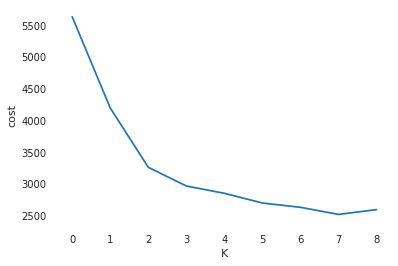

In [ ]:
from kmodes.kprototypes import KPrototypes

cost = []
for num_clusters in list(range(1, 10)):
    kproto = KPrototypes(n_clusters=num_clusters, init='Huang', random_state=42) 
    kproto.fit_predict(X_propcaDf, categorical=[1, 2, 3])
    cost.append(kproto.cost_)

plt.plot(cost)
plt.xlabel('K')
plt.ylabel('cost')
plt.show

In [ ]:
kproto = KPrototypes(n_clusters=3, init='Huang', verbose=0, random_state=42,max_iter=20, n_init=50,n_jobs=-2,gamma=.25) 
clusters = kproto.fit_predict(X_propcaDf, categorical=[1, 2, 3])

In [ ]:
Xnum2 = X_propcaDf.drop(['gender','state', 'country'], axis=1)
XCat2 = X_propcaDf.drop(['principal component 1'], axis=1)
XCat2 = pd.get_dummies(XCat2)

labels2 = kproto.labels_
usedGamma2 = kproto.gamma

# calculate the Silhouette score for K-means and K-modes sides 
silScoreKMeans2 = silhouette_score(Xnum2, labels, metric='euclidean')
print('KMeans silhouette: ' + str(silScoreKMeans2))

silScoreKModes2 = silhouette_score(XCat2, labels, metric='hamming')
print('KMeans silhouette: ' + str(silScoreKModes2))

# Average silhouette
silScore2 = (silScoreKMeans2 + silScoreKModes2) / 2
print('The avg silscore: ', silScore2)

silScore22 = (silScoreKModes1*usedGamma2) + (silScoreKMeans2*(1-usedGamma2))
print('The avg silscore: ', silScore22)

KMeans silhouette: -0.06869642438706947
KMeans silhouette: 0.2516835937053125
The avg silscore:  0.09149358465912152
The avg silscore:  0.01139858013602603


In [ ]:
df_filled['cluster4'] = clusters + 1
print(df_filled['cluster4'].value_counts())

3    16744
1    13876
2     1364
Name: cluster4, dtype: int64


In [ ]:
gender = pd.DataFrame(columns=['F', 'M'])
gender.loc['cluster 1'] = df_filled[df_filled['cluster4']==1].groupby('gender').count()['cluster4']/df_filled[df_filled['cluster4']==1].count()['cluster4']
gender.loc['cluster 2'] = df_filled[df_filled['cluster4']==2].groupby('gender').count()['cluster4']/df_filled[df_filled['cluster4']==2].count()['cluster4']
gender.loc['cluster 3'] = df_filled[df_filled['cluster4']==3].groupby('gender').count()['cluster4']/df_filled[df_filled['cluster4']==3].count()['cluster4']

In [ ]:
gender

,F,M
cluster 1,1.000000,NaN
cluster 2,0.359971,0.640029
cluster 3,NaN,1.000000


In [ ]:
gender.fillna(0)

,F,M
cluster 1,1.000000,0.000000
cluster 2,0.359971,0.640029
cluster 3,0.000000,1.000000


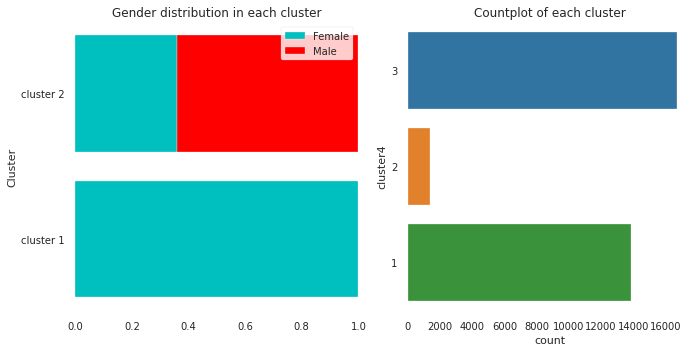

In [ ]:
plt.subplots(1, 2, figsize=(10, 5))

# Stacked horizontal bar chart of percentages
plt.subplot(1, 2, 1)
plt.barh(gender.index, gender.F, color='c', label='Female')
plt.barh(gender.index, gender.M, left=gender.F, color='r', label='Male')
plt.title('Gender distribution in each cluster')
plt.ylabel('Cluster')
plt.legend()

# Countplot of clusters
plt.subplot(1, 2, 2)
sns.countplot(y='cluster4', data=df_filled, order=[3, 2, 1])
plt.title("Countplot of each cluster")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Median age for each cluster')

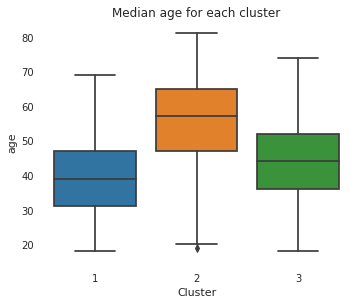

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 2, 1)
sns.boxplot(x='cluster4', y='age', data=df_filled)
plt.xlabel('Cluster')
plt.title('Median age for each cluster')

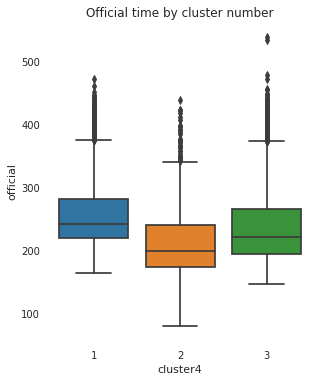

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 3, 1)
sns.boxplot(x='cluster4', y='official', data=df_filled)
plt.title('Official time by cluster number')
    
plt.tight_layout()
plt.show()

Though K-mean has better Sihouette score but the feature are mostly categorical so K-prototype is better. And without PCA give better score so we choose that.

#Persona

In [ ]:
persona = pd.DataFrame(index=['cluster 1','cluster 2','cluster 3','cluster 4','cluster 5'])

In [ ]:
state = pd.DataFrame(columns=df_filled['state'].value_counts().index.tolist())
state.loc['cluster 1'] = df_filled[df_filled['cluster3']==1].groupby('state').count()['cluster3']
state.loc['cluster 2'] = df_filled[df_filled['cluster3']==2].groupby('state').count()['cluster3']
state.loc['cluster 3'] = df_filled[df_filled['cluster3']==3].groupby('state').count()['cluster3']
state.loc['cluster 4'] = df_filled[df_filled['cluster3']==4].groupby('state').count()['cluster3']
state.loc['cluster 5'] = df_filled[df_filled['cluster3']==5].groupby('state').count()['cluster3']
state

,MA,unknown,CA,NY,ON,PA,TX,IL,OH,FL,VA,MI,NC,WA,CO,NJ,MN,MD,NH,CT,GA,WI,UT,QC,OR,AZ,IN,TN,MO,ME,RI,AB,BC,DC,SC,IA,KY,KS,VT,ID,NE,NS,AL,OK,NV,LA,NM,MT,DE,WV,NB,AK,HI,AR,MB,MS,SK,SD,ND,PE,WY,NL,PR,AE,YT,NT,GU,AA,AP
cluster 1,NaN,1969.0,NaN,NaN,691.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,323.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,134.0,130.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.0,NaN,NaN,NaN,28.0,NaN,23.0,NaN,NaN,14.0,NaN,17.0,NaN,NaN,5.0,2.0,NaN,NaN,NaN
cluster 2,3611.0,NaN,NaN,718.0,NaN,437.0,413.0,423.0,345.0,319.0,317.0,305.0,294.0,233.0,220.0,272.0,256.0,227.0,255.0,236.0,186.0,187.0,158.0,NaN,146.0,118.0,135.0,105.0,116.0,102.0,127.0,NaN,NaN,91.0,80.0,64.0,77.0,60.0,45.0,35.0,41.0,NaN,46.0,39.0,34.0,37.0,21.0,22.0,30.0,31.0,NaN,18.0,19.0,20.0,NaN,22.0,NaN,13.0,9.0,NaN,8.0,NaN,8.0,2.0,NaN,NaN,NaN,1.0,NaN
cluster 3,NaN,NaN,1415.0,136.0,NaN,105.0,101.0,70.0,85.0,82.0,85.0,80.0,51.0,65.0,64.0,50.0,39.0,56.0,33.0,43.0,38.0,49.0,26.0,NaN,42.0,33.0,36.0,23.0,25.0,27.0,10.0,NaN,NaN,9.0,13.0,15.0,15.0,18.0,11.0,10.0,16.0,NaN,11.0,15.0,10.0,6.0,9.0,10.0,9.0,3.0,NaN,4.0,5.0,4.0,NaN,3.0,NaN,5.0,2.0,NaN,7.0,NaN,4.0,1.0,NaN,NaN,1.0,NaN,NaN
cluster 4,67.0,185.0,108.0,44.0,55.0,31.0,36.0,38.0,27.0,31.0,25.0,29.0,9.0,25.0,32.0,20.0,10.0,13.0,13.0,19.0,17.0,16.0,11.0,27.0,20.0,16.0,7.0,8.0,7.0,17.0,5.0,11.0,12.0,2.0,9.0,6.0,4.0,3.0,11.0,7.0,3.0,12.0,7.0,5.0,5.0,2.0,3.0,7.0,NaN,6.0,3.0,7.0,4.0,4.0,3.0,1.0,1.0,1.0,3.0,4.0,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN
cluster 5,3909.0,422.0,803.0,655.0,306.0,428.0,442.0,385.0,303.0,318.0,286.0,281.0,264.0,273.0,262.0,227.0,251.0,231.0,225.0,223.0,202.0,181.0,236.0,69.0,198.0,151.0,113.0,125.0,108.0,104.0,91.0,62.0,63.0,103.0,80.0,68.0,48.0,62.0,75.0,72.0,51.0,29.0,41.0,33.0,39.0,33.0,38.0,26.0,24.0,16.0,13.0,21.0,21.0,20.0,16.0,20.0,8.0,13.0,17.0,5.0,7.0,NaN,3.0,4.0,NaN,1.0,NaN,NaN,1.0


In [ ]:
persona['state'] = state.idxmax(axis = 1).values

In [ ]:
country = pd.DataFrame(columns=df_filled['country'].value_counts().index.tolist())
country.loc['cluster 1'] = df_filled[df_filled['cluster3']==1].groupby('country').count()['cluster3']
country.loc['cluster 2'] = df_filled[df_filled['cluster3']==2].groupby('country').count()['cluster3']
country.loc['cluster 3'] = df_filled[df_filled['cluster3']==3].groupby('country').count()['cluster3']
country.loc['cluster 4'] = df_filled[df_filled['cluster3']==4].groupby('country').count()['cluster3']
country.loc['cluster 5'] = df_filled[df_filled['cluster3']==5].groupby('country').count()['cluster3']
country

,USA,CAN,GBR,ITA,MEX,GER,JPN,AUS,IRL,FRA,ESP,BRA,SWE,SUI,KOR,NED,HKG,DEN,CHN,COL,CHI,ISL,FIN,BEL,SIN,AUT,NOR,RSA,VEN,TPE,BER,RUS,UAE,NZL,CRC,ARG,GUA,POL,KEN,SLO,POR,GRE,ISR,PER,ETH,IND,LUX,CZE,SVK,TUR,PHI,MAS,DOM,ECU,HUN,PAN,UKR,QAT,THA,EGY,ROU,ESA,BAH,MAR,VGB,CRO,INA,BAR,BLR,BRN,LIE,EST,ZIM,CAY,TRI,TAN,URU,BOL
cluster 1,NaN,1474.0,253.0,169.0,151.0,150.0,118.0,90.0,93.0,93.0,76.0,65.0,53.0,48.0,50.0,50.0,42.0,44.0,33.0,36.0,25.0,18.0,23.0,21.0,19.0,16.0,15.0,12.0,15.0,15.0,9.0,14.0,14.0,12.0,13.0,10.0,9.0,14.0,1.0,6.0,7.0,7.0,6.0,4.0,NaN,6.0,3.0,3.0,2.0,2.0,4.0,3.0,3.0,2.0,3.0,3.0,2.0,1.0,NaN,1.0,2.0,2.0,NaN,NaN,1.0,1.0,1.0,NaN,NaN,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,NaN
cluster 2,11134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cluster 3,3085.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cluster 4,803.0,129.0,16.0,16.0,5.0,7.0,33.0,9.0,4.0,6.0,6.0,8.0,5.0,4.0,2.0,3.0,1.0,4.0,4.0,2.0,1.0,1.0,3.0,1.0,NaN,2.0,2.0,2.0,1.0,2.0,NaN,3.0,1.0,NaN,NaN,2.0,2.0,1.0,10.0,3.0,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cluster 5,12211.0,572.0,77.0,27.0,49.0,25.0,24.0,25.0,22.0,16.0,7.0,14.0,8.0,10.0,8.0,1.0,10.0,2.0,5.0,2.0,3.0,9.0,2.0,5.0,4.0,4.0,4.0,5.0,3.0,1.0,9.0,1.0,2.0,5.0,3.0,3.0,4.0,NaN,1.0,NaN,2.0,1.0,1.0,3.0,NaN,NaN,1.0,1.0,NaN,2.0,NaN,1.0,NaN,1.0,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,1.0,1.0,NaN,1.0


In [ ]:
persona['country'] = country.idxmax(axis = 1).values

In [ ]:
gender = pd.DataFrame(columns=df_filled['gender'].value_counts().index.tolist())
gender.loc['cluster 1'] = df_filled[df_filled['cluster3']==1].groupby('gender').count()['cluster3']
gender.loc['cluster 2'] = df_filled[df_filled['cluster3']==2].groupby('gender').count()['cluster3']
gender.loc['cluster 3'] = df_filled[df_filled['cluster3']==3].groupby('gender').count()['cluster3']
gender.loc['cluster 4'] = df_filled[df_filled['cluster3']==4].groupby('gender').count()['cluster3']
gender.loc['cluster 5'] = df_filled[df_filled['cluster3']==5].groupby('gender').count()['cluster3']
gender

,M,F
cluster 1,2967,476
cluster 2,11134,NaN
cluster 3,2850,235
cluster 4,666,451
cluster 5,NaN,13205


In [ ]:
persona['gender'] = gender.astype(float).idxmax(axis = 1).values

In [ ]:
persona

,state,country,gender
cluster 1,unknown,CAN,M
cluster 2,MA,USA,M
cluster 3,CA,USA,M
cluster 4,unknown,USA,M
cluster 5,MA,USA,F


In [ ]:
age_mean = []
for i in range (5):
    age_mean.append(df_filled[df_filled['cluster3']==i+1]['age'].mean())
persona['age_mean'] = age_mean

In [ ]:
division = []
for i in range (5):
    division.append(df_filled[df_filled['cluster3']==i+1]['division'].mean())
persona['division'] = division

In [ ]:
official = []
for i in range (5):
    official.append(df_filled[df_filled['cluster3']==i+1]['official'].mean())
persona['official'] = official

In [ ]:
overall = []
for i in range (5):
    overall.append(df_filled[df_filled['cluster3']==i+1]['overall'].mean())
persona['overall'] = overall

In [ ]:
pace = []
for i in range (5):
    pace.append(df_filled[df_filled['cluster3']==i+1]['pace'].mean())
persona['pace'] = pace

In [ ]:
persona

,state,country,gender,age_mean,division,official,overall,pace,cluster size,cluster size_%
cluster 1,unknown,CAN,M,47.546035,1255.780424,228.864784,13288.443509,8.737223,0,0.000000
cluster 2,MA,USA,M,41.809772,2168.182055,240.553029,15192.430214,9.181959,3443,10.764757
cluster 3,CA,USA,M,49.764992,754.515397,220.441945,11373.062561,8.415676,11134,34.811156
cluster 4,unknown,USA,M,55.373321,33.838854,208.551934,9931.852283,7.962623,3085,9.645448
cluster 5,MA,USA,F,38.755017,2346.189095,256.926264,18835.847861,9.807031,1117,3.492371


Text(0.5, 1.0, 'Median age for each cluster')

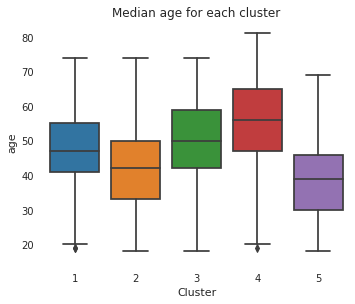

In [ ]:
plt.figure(figsize=(12, 15))

plt.subplot(3, 2, 1)
sns.boxplot(x='cluster3', y='age', data=df_filled)
plt.xlabel('Cluster')
plt.title('Median age for each cluster')

In [ ]:
cluster_size = []
for i in range (5):
    cluster_size.append(df_filled[df_filled['cluster3']==i+1].shape[0])
persona['cluster size'] = cluster_size
persona['cluster size_%'] = persona['cluster size']/len(df_filled)*100

In [ ]:
persona

,state,country,gender,age_mean,division,official,overall,pace,cluster size,cluster size_%
cluster 1,unknown,CAN,M,47.546035,1255.780424,228.864784,13288.443509,8.737223,3443,10.764757
cluster 2,MA,USA,M,41.809772,2168.182055,240.553029,15192.430214,9.181959,11134,34.811156
cluster 3,CA,USA,M,49.764992,754.515397,220.441945,11373.062561,8.415676,3085,9.645448
cluster 4,unknown,USA,M,55.373321,33.838854,208.551934,9931.852283,7.962623,1117,3.492371
cluster 5,MA,USA,F,38.755017,2346.189095,256.926264,18835.847861,9.807031,13205,41.286268
